In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

# **Завантаження попередньо підготовлених датасетів**

In [2]:
path_users = './data/Normalized_dataset_users.csv'
path_features = './data/Normalized_dataset_features.csv'
path_user_profiles = './data/User_Profiles.csv'
path_user_profiles_KMEANS = './data/User_Profiles_clusterized.csv'
path_user_profiles_Hierarchical = './data/User_Profiles_hierarchical_clusterized.csv'

In [3]:
df_users = pd.read_csv(path_users, on_bad_lines='skip')
df_users.shape

(9711301, 4)

In [4]:
df_features = pd.read_csv(path_features, on_bad_lines='skip')
df_features.shape

(50683, 18)

In [5]:
df_profiles = pd.read_csv(path_user_profiles, on_bad_lines='skip', index_col='Unnamed: 0')
df_profiles.shape

(1000, 12)

In [6]:
df_profiles.sample()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
424d7ee9a296acccdc7c7bf6187d4c2f91689a38,0.534849,0.550773,0.459031,0.80124,0.638158,0.065423,0.425894,0.144824,0.187712,0.457157,0.522457,0.776974


In [7]:
df_profiles_clustered_kmeans = pd.read_csv(path_user_profiles_KMEANS, on_bad_lines='skip', index_col='user_id')
df_profiles_clustered_kmeans.shape

(1000, 13)

In [8]:
df_profiles_clustered_kmeans.sample()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,cluster_k_5
user_id,,,,,,,,,,,,,
5374d33548292f2b45cc00accd2ae636fd48f0ae,0.484466,0.670404,0.530619,0.812732,0.635417,0.073355,0.250304,0.388868,0.206493,0.425575,0.532212,0.757639,4


In [9]:
df_profiles_clustered_kmeans.columns = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'cluster']

In [10]:
df_profiles_clustered_kmeans.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'cluster'],
      dtype='object')

In [11]:
df_profiles_clustered_hierarchical = pd.read_csv(path_user_profiles_Hierarchical, on_bad_lines='skip', index_col='user_id')
df_profiles_clustered_hierarchical.shape

(1000, 13)

In [12]:
df_profiles_clustered_hierarchical.sample()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,cluster
user_id,,,,,,,,,,,,,
797cbbace429fee2717a14ff992df0acd3990368,0.489351,0.59471,0.458234,0.79679,0.522673,0.06108,0.316531,0.100351,0.265933,0.473731,0.534668,0.793317,2


In [13]:
df_profiles_clustered_hierarchical.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'cluster'],
      dtype='object')

### **Оберемо випадкового користувача**

In [14]:
df_users.groupby('user_id').count().sort_values(by='track_id', ascending=False)

,track_id,playcount,playcount_norm
user_id,,,
ec6dfcf19485cb011e0b22637075037aae34cf26,784,784,784
4e11f45d732f4861772b2906f81a7d384552ad12,384,384,384
726da71c2c2ea119119a7957517fccd028d1be76,376,376,376
113255a012b2affeab62607563d03fbdf31b08e7,367,367,367
7adec7f006cb09482d36609d205293d8b61f030e,366,366,366
...,...,...,...
c736e87d6a5193662b776136067a7e104f970fbb,1,1,1
3d3750d24e0200ab74aee8f3a11f9c7778f22d4d,1,1,1
c737a8a65917262b5ff3289242f83929277554a1,1,1,1


Візьмемо користувача з id '726da71c2c2ea119119a7957517fccd028d1be76', оскільки він має багато даних про прослуховування.

In [15]:
random_user_id = '726da71c2c2ea119119a7957517fccd028d1be76'
random_user = df_profiles[df_profiles.index == random_user_id]
random_user

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
726da71c2c2ea119119a7957517fccd028d1be76,0.534128,0.686606,0.484437,0.820491,0.711957,0.06595,0.207395,0.2059,0.200038,0.49707,0.522242,0.779348


In [16]:
random_user_kmeans = df_profiles_clustered_kmeans[df_profiles_clustered_kmeans.index == random_user_id]
random_user_kmeans

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,cluster
user_id,,,,,,,,,,,,,
726da71c2c2ea119119a7957517fccd028d1be76,0.534128,0.686606,0.484437,0.820491,0.711957,0.06595,0.207395,0.2059,0.200038,0.49707,0.522242,0.779348,3


In [17]:
random_user_hierarchical = df_profiles_clustered_hierarchical[df_profiles_clustered_hierarchical.index == random_user_id]
random_user_hierarchical

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,cluster
user_id,,,,,,,,,,,,,
726da71c2c2ea119119a7957517fccd028d1be76,0.534128,0.686606,0.484437,0.820491,0.711957,0.06595,0.207395,0.2059,0.200038,0.49707,0.522242,0.779348,1


In [28]:
features = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature']

# **Автоматизація процесу рекомендацій**

In [44]:
# type = ['cossine', 'pearson', 'manhattan', 'minkowski_{n}, 'euclidean']
def get_recommendations(user_profile, tracks_df, features, type_func='cossine'):

  def cossine_similarity(user_profile:pd.DataFrame, songs_df:pd.DataFrame):
    return np.dot(user_profile, songs_df) / (np.linalg.norm(user_profile) * np.linalg.norm(songs_df))

  def manhattan_distance(user_profile, track_row):
    user_profile = np.asarray(user_profile)
    track_row = np.asarray(track_row)
    return np.sum(np.abs(user_profile - track_row))

  def euclidean_distance(user_profile, songs_df):
    user_profile = np.asarray(user_profile)
    songs_df = np.asarray(songs_df)
    return np.sqrt(np.sum((user_profile - songs_df) ** 2))

  def pearson_correlation(user_profile: pd.DataFrame, tracks_df: pd.DataFrame):
    user_profile_series = user_profile
    if type(user_profile) is pd.DataFrame:
      user_profile_series = user_profile.iloc[0].astype(float)

    correlations = tracks_df.apply(lambda track: user_profile_series.corr(track.astype(float)), axis=1)
    return correlations

  def minkowski_distance(user_profile, track_row, p):
    user_profile = np.asarray(user_profile)
    track_row = np.asarray(track_row)
    return np.sum(np.abs(user_profile - track_row) ** p) ** (1 / p)

  df = tracks_df[features]
  if type_func == 'cossine':
    return df.apply(lambda track: cossine_similarity(user_profile, track.astype(float))[0], axis=1)
  elif type_func == 'pearson':
    return pearson_correlation(user_profile=user_profile, tracks_df=df)
  elif type_func == 'manhattan':
    return df.apply(lambda track: manhattan_distance(user_profile.iloc[0].astype(float), track.astype(float)), axis=1)
  elif type_func == 'euclidean':
    return df.apply(lambda track: euclidean_distance(user_profile.iloc[0].astype(float), track.astype(float)), axis=1)
  elif type_func.startswith('minkowski_'):
    p = int(type_func.split('_')[-1])
    return df.apply(lambda track: minkowski_distance(user_profile.iloc[0].astype(float), track.astype(float), p=p), axis=1)

In [20]:
df_users = df_users.merge(df_profiles_clustered_kmeans['cluster'], left_on='user_id', right_index=True)

In [23]:
df_users.sample()

,track_id,user_id,playcount,playcount_norm,cluster
5698781,TRAKKTI128F42B4F25,aa32188964b17f4e264a26b57c7c796e74132360,3,0.000679,0


In [24]:
df_users.columns = ['track_id', 'user_id', 'playcount', 'playcount_norm', 'kmeans_cluster']

In [25]:
df_users = df_users.merge(df_profiles_clustered_hierarchical['cluster'], left_on='user_id', right_index=True)

In [26]:
df_users.columns = ['track_id', 'user_id', 'playcount', 'playcount_norm', 'kmeans_cluster', 'hierarchical_cluster']

In [42]:
def get_different_recommendations(user_profile, tracks_df, features, metrics):
    res = {}
    for metric in metrics:
        if metric not in res:
            res[metric] = []
        res[metric] = get_recommendations(user_profile=user_profile, tracks_df=tracks_df, features=features, type_func=metric)
    return res

In [45]:
recommendations = get_different_recommendations(random_user, 
                                                df_features, 
                                                features, 
                                                metrics=['cossine', 'pearson', 'manhattan', 'minkowski_3', 'minkowski_5', 
                                                         'minkowski_10', 'minkowski_100', 'euclidean'])

C:\Users\Влада\AppData\Local\Temp\ipykernel_18068\858570187.py:5: RuntimeWarning: invalid value encountered in divide
  return np.dot(user_profile, songs_df) / (np.linalg.norm(user_profile) * np.linalg.norm(songs_df))
F:\programs\anaconda3\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
F:\programs\anaconda3\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [48]:
metrics=['cossine', 'pearson', 'manhattan', 'minkowski_3', 'minkowski_5', 'minkowski_10', 'minkowski_100', 'euclidean']

In [46]:
len(recommendations)

8

# **Вимірювання точності**

In [49]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, root_mean_squared_error

In [65]:
def simmilarity(user_profile, list_of_recs, features):
  recs = []
  df = list_of_recs[features]
  for col in df.columns:
    recs.append(df[col].median())
  return {
      'mae': mean_absolute_error(y_true=user_profile.T.values, y_pred=recs),
      'mse': mean_squared_error(y_true=user_profile.T.values, y_pred=recs),
      'rmse': root_mean_squared_error(y_true=user_profile.T.values, y_pred=recs)
  }

In [97]:
error_measures = {}
for rec in recommendations:
  if rec not in error_measures:
    error_measures[rec] = {}
  error_measures[rec] = (simmilarity(random_user, pd.concat([recommendations[rec],df_features], axis=1).sort_values(by=0, ascending=(rec not in metrics[0:2])).iloc[:20], features))

In [98]:
error_measures

{'cossine': {'mae': 0.07833891583698718,
  'mse': 0.012186704651264356,
  'rmse': 0.11039340854989647},
 'pearson': {'mae': 0.08770798710543333,
  'mse': 0.015105727084428734,
  'rmse': 0.12290535824132622},
 'manhattan': {'mae': 0.04618556388032966,
  'mse': 0.00835656542090218,
  'rmse': 0.09141425173845805},
 'minkowski_3': {'mae': 0.05352605768314316,
  'mse': 0.008160984795943028,
  'rmse': 0.09033816909780178},
 'minkowski_5': {'mae': 0.05058712863687262,
  'mse': 0.008154793905620022,
  'rmse': 0.09030389751068346},
 'minkowski_10': {'mae': 0.05965806592896303,
  'mse': 0.009272633240652023,
  'rmse': 0.09629451303502201},
 'minkowski_100': {'mae': 0.07285459334115367,
  'mse': 0.012027531099459726,
  'rmse': 0.10967010121021921},
 'euclidean': {'mae': 0.048207649003286585,
  'mse': 0.007900712578342335,
  'rmse': 0.08888595264912412}}

In [99]:
min_metrics = {}
for metric in ['mae', 'mse', 'rmse']:
    best = min(error_measures.items(), key=lambda item: item[1][metric])
    min_metrics[metric] = best[0]

min_metrics

{'mae': 'manhattan', 'mse': 'euclidean', 'rmse': 'euclidean'}

In [79]:
def plot_user_recommendation(recommendations:pd.DataFrame, features:list, user_profile:pd.DataFrame, metric:str):
  num_features = len(features)

  angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False)
  angles = np.append(angles, angles[0])

  values_rs = user_profile[features].values.flatten()
  values_rs = np.append(values_rs, values_rs[0])

  rows = recommendations.shape[0] // 5
  fig, axs = plt.subplots(rows, 5, figsize=(25, 10 * (rows // 2)), subplot_kw={'projection': 'polar'}, layout='constrained')
  fig.suptitle(f'Visualization of User Recommendations ({metric})', fontsize=16, fontweight='bold')

  for i, (index, rec) in enumerate(recommendations.iterrows()):
      row = i // 5
      col = i % 5

      values = rec[features].values
      values = np.append(values, values[0])

      ax = axs[row, col]
      ax.fill(angles, values, color='maroon', alpha=0.25)
      ax.plot(angles, values, color='maroon', linewidth=2)
      ax.fill(angles, values_rs, color='yellow', alpha=0.1)
      ax.plot(angles, values_rs, color='yellow', linewidth=2)
      ax.set_xticks(angles[:-1])
      ax.set_xticklabels(features, fontsize=8)
      ax.set_yticklabels([])
      ax.set_title(f'{rec["name"]}\nby {rec["artist"]}',size='medium', fontweight='bold')

  plt.show()

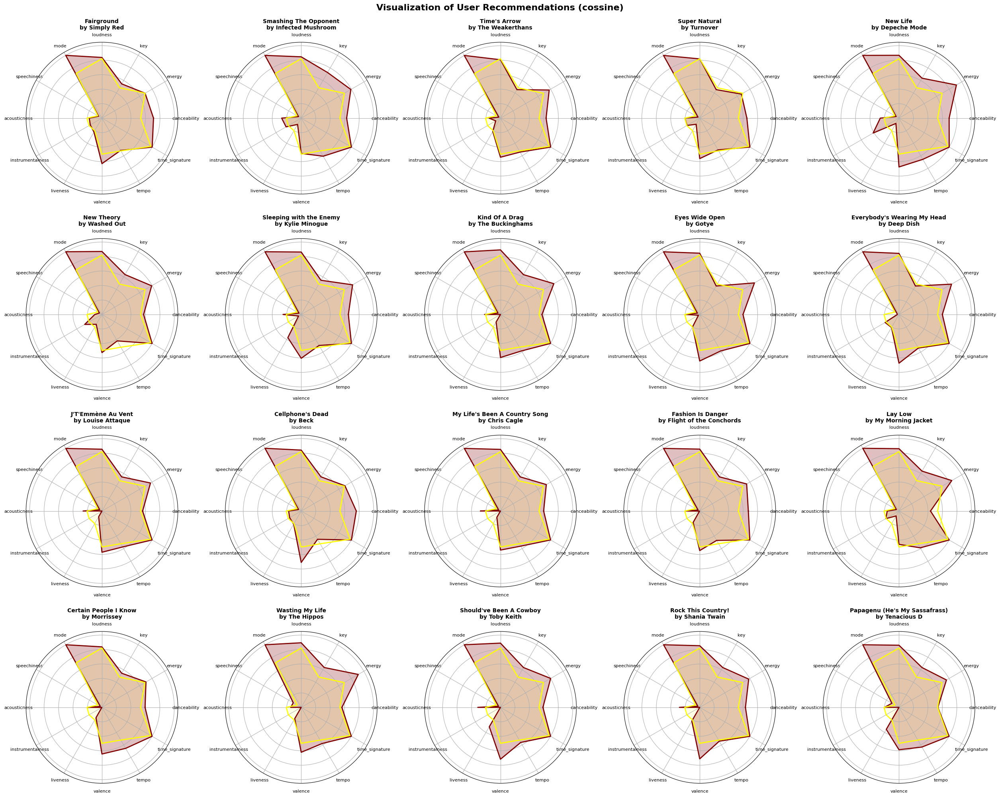

In [81]:
plot_user_recommendation(
    recommendations=pd.concat([recommendations[metrics[0]],df_features], axis=1).sort_values(by=0, ascending=False).iloc[:20],
    features=features,
    user_profile=random_user,
    metric=metrics[0]
)

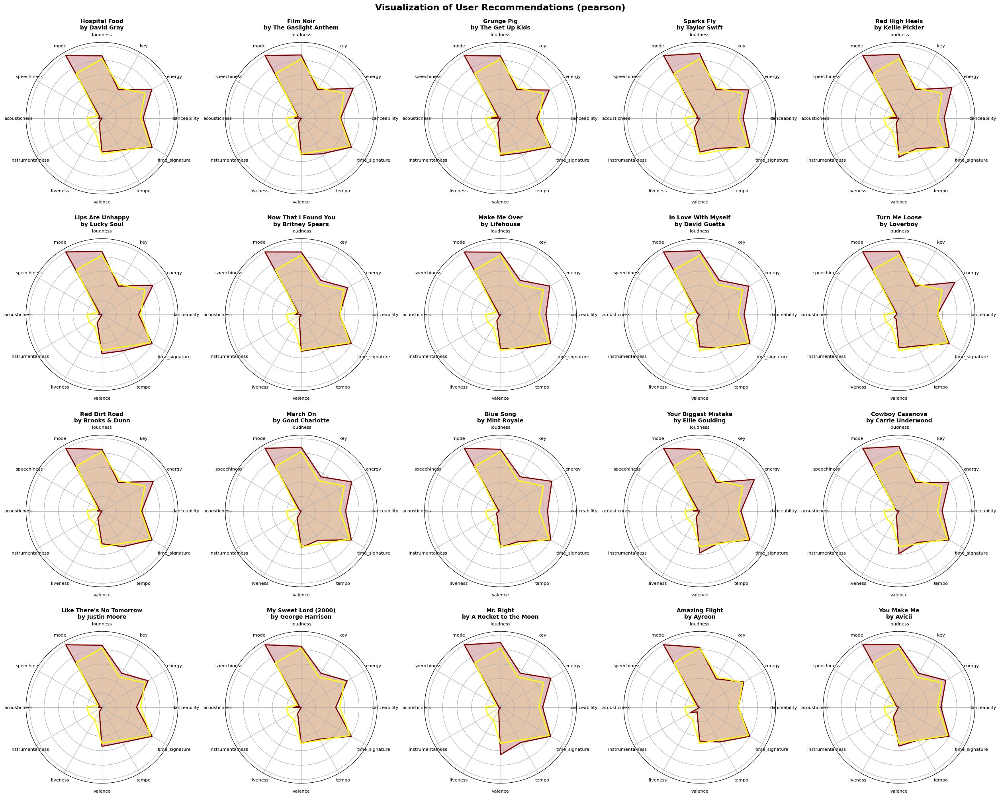

In [82]:
plot_user_recommendation(
    recommendations=pd.concat([recommendations[metrics[1]],df_features], axis=1).sort_values(by=0, ascending=False).iloc[:20],
    features=features,
    user_profile=random_user,
    metric=metrics[1]
)

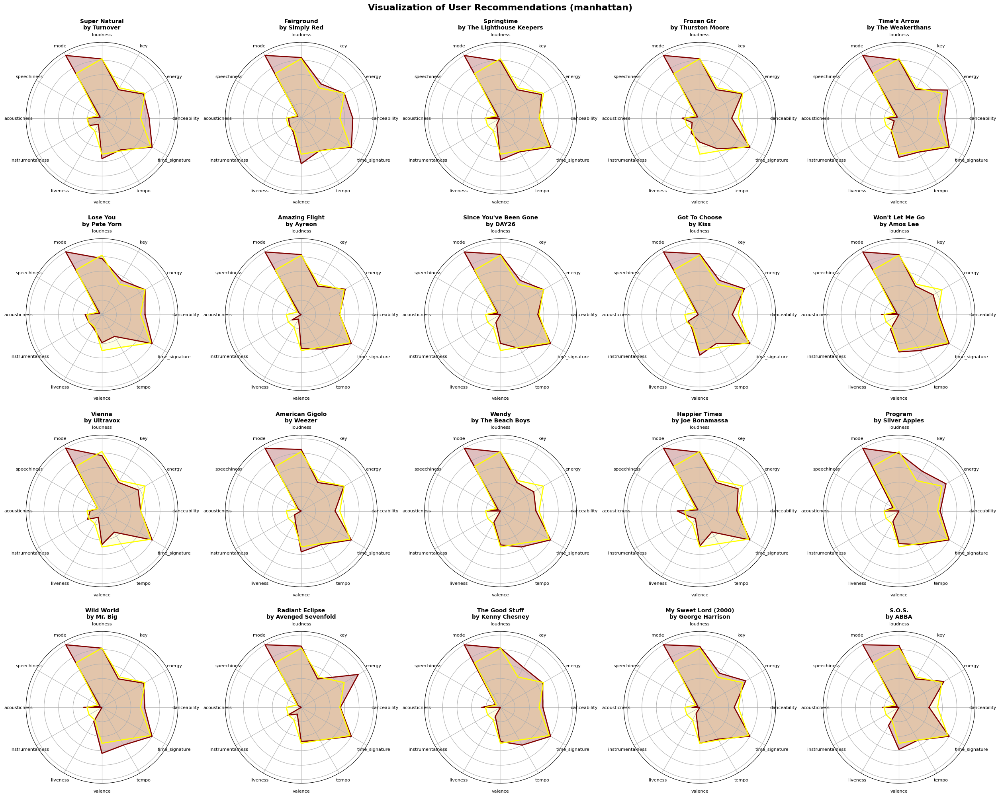

In [84]:
plot_user_recommendation(
    recommendations=pd.concat([recommendations[metrics[2]],df_features], axis=1).sort_values(by=0, ascending=True).iloc[:20],
    features=features,
    user_profile=random_user,
    metric=metrics[2]
)

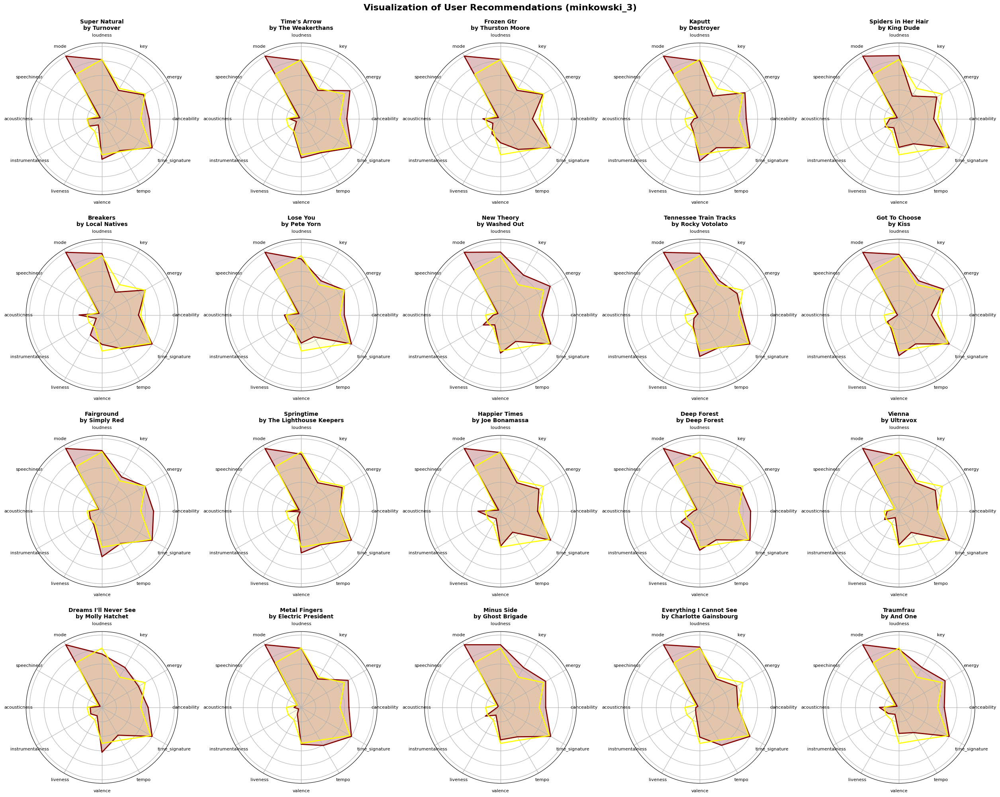

In [100]:
plot_user_recommendation(
    recommendations=pd.concat([recommendations[metrics[3]],df_features], axis=1).sort_values(by=0, ascending=True).iloc[:20],
    features=features,
    user_profile=random_user,
    metric=metrics[3]
)

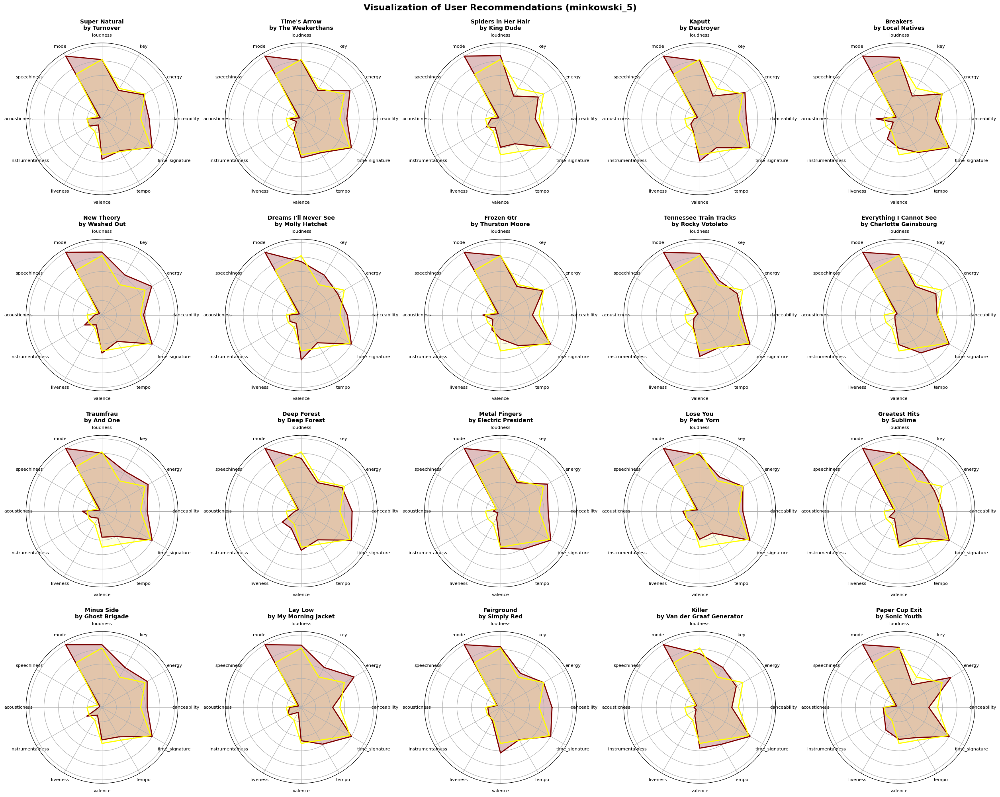

In [101]:
plot_user_recommendation(
    recommendations=pd.concat([recommendations[metrics[4]],df_features], axis=1).sort_values(by=0, ascending=True).iloc[:20],
    features=features,
    user_profile=random_user,
    metric=metrics[4]
)

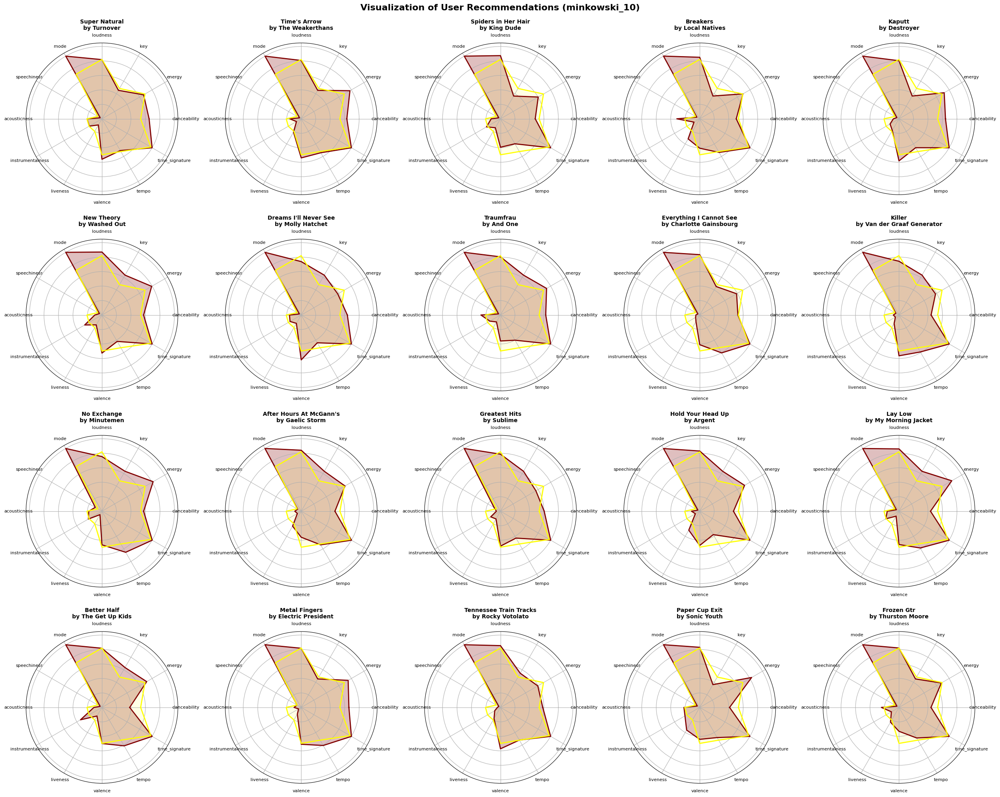

In [102]:
plot_user_recommendation(
    recommendations=pd.concat([recommendations[metrics[5]],df_features], axis=1).sort_values(by=0, ascending=True).iloc[:20],
    features=features,
    user_profile=random_user,
    metric=metrics[5]
)

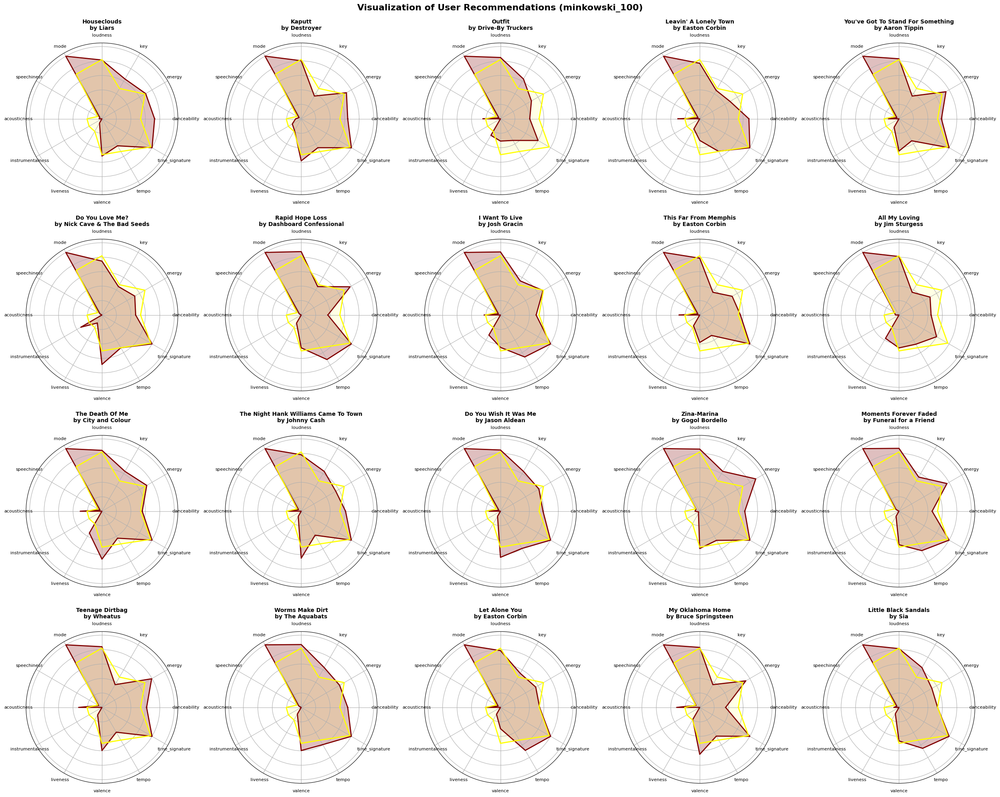

In [103]:
plot_user_recommendation(
    recommendations=pd.concat([recommendations[metrics[6]],df_features], axis=1).sort_values(by=0, ascending=True).iloc[:20],
    features=features,
    user_profile=random_user,
    metric=metrics[6]
)

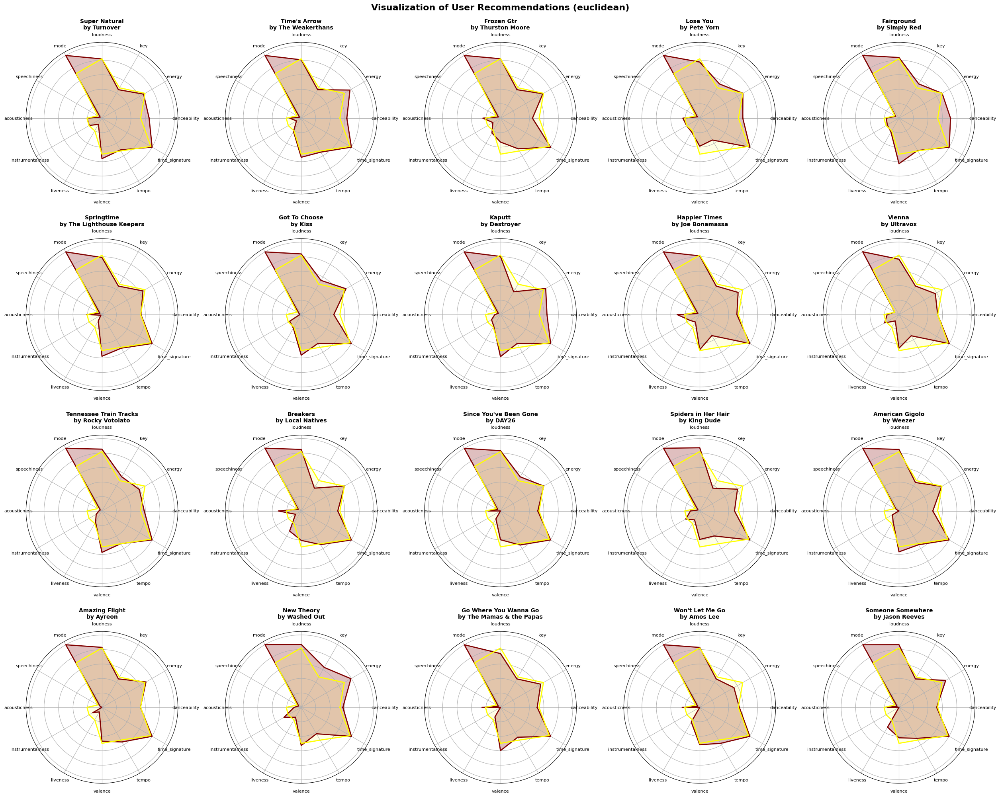

In [104]:
plot_user_recommendation(
    recommendations=pd.concat([recommendations[metrics[7]],df_features], axis=1).sort_values(by=0, ascending=True).iloc[:20],
    features=features,
    user_profile=random_user,
    metric=metrics[7]
)

# **Визначимо кількість схожих рекомендацій**

In [107]:
from functools import reduce

## **Всі 8 метрик**

In [108]:
dfs = [    
    pd.concat([recommendations[metrics[0]],df_features], axis=1).sort_values(by=0, ascending=False),
    pd.concat([recommendations[metrics[1]],df_features], axis=1).sort_values(by=0, ascending=False),
    pd.concat([recommendations[metrics[2]],df_features], axis=1).sort_values(by=0, ascending=True),
    pd.concat([recommendations[metrics[3]],df_features], axis=1).sort_values(by=0, ascending=True),
    pd.concat([recommendations[metrics[4]],df_features], axis=1).sort_values(by=0, ascending=True),
    pd.concat([recommendations[metrics[5]],df_features], axis=1).sort_values(by=0, ascending=True),
    pd.concat([recommendations[metrics[6]],df_features], axis=1).sort_values(by=0, ascending=True),
    pd.concat([recommendations[metrics[7]],df_features], axis=1).sort_values(by=0, ascending=True)
]

merged_df = reduce(lambda left, right: pd.merge(left, right, how='inner'), dfs)

In [109]:
merged_df

,0,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature


## **Попарно**

In [130]:
from termcolor import colored, cprint

In [133]:
for i in range(len(metrics)):
    for j in range(len(metrics)):
        if i != j:
            dfs = [    
                pd.concat([recommendations[metrics[i]],df_features], axis=1).sort_values(by=0, ascending=False),
                pd.concat([recommendations[metrics[j]],df_features], axis=1).sort_values(by=0, ascending=True),
            ]
            
            n_sim = reduce(lambda left, right: pd.merge(left, right, how='inner'), dfs).shape
            print(colored(f'{metrics[i]} and {metrics[j]:<15} {n_sim}', 'red' if n_sim[0] == 0 else 'green'))

cossine and pearson         (1, 19)
cossine and manhattan       (0, 19)
cossine and minkowski_3     (0, 19)
cossine and minkowski_5     (0, 19)
cossine and minkowski_10    (0, 19)
cossine and minkowski_100   (0, 19)
cossine and euclidean       (0, 19)
pearson and cossine         (1, 19)
pearson and manhattan       (0, 19)
pearson and minkowski_3     (0, 19)
pearson and minkowski_5     (0, 19)
pearson and minkowski_10    (0, 19)
pearson and minkowski_100   (0, 19)
pearson and euclidean       (0, 19)
manhattan and cossine         (0, 19)
manhattan and pearson         (0, 19)
manhattan and minkowski_3     (0, 19)
manhattan and minkowski_5     (0, 19)
manhattan and minkowski_10    (0, 19)
manhattan and minkowski_100   (0, 19)
manhattan and euclidean       (0, 19)
minkowski_3 and cossine         (0, 19)
minkowski_3 and pearson         (0, 19)
minkowski_3 and manhattan       (0, 19)
minkowski_3 and minkowski_5     (0, 19)
minkowski_3 and minkowski_10    (0, 19)
minkowski_3 and minkowski_100 

## **Перевіримо чи є співпадіння в рекомендаціях з тими треками, які користувач вже слухав**

In [158]:
user_id = random_user.index[0]
user_tracks = df_users[df_users['user_id'] == user_id]
user_tracks_ids = user_tracks['track_id']

In [159]:
for j in range(len(metrics)):
    if i != j:
        df = pd.concat([recommendations[metrics[j]], df_features], axis=1).sort_values(by=0, ascending=True).iloc[:20]
        df_filtered = df[df['track_id'].isin(user_tracks_ids)]

        n_sim = df_filtered.shape
        print(colored(f'{metrics[j]:<20} {n_sim}', 'red' if n_sim[0] == 0 else 'green'))

cossine              (0, 19)
pearson              (0, 19)
manhattan            (0, 19)
minkowski_3          (0, 19)
minkowski_5          (0, 19)
minkowski_10         (0, 19)
minkowski_100        (0, 19)


# **Перевіримо ще на декількох користувачах**

## **Користувач 1**

In [134]:
random_user_1 = df_profiles.sample()

recommendations_1 = get_different_recommendations(random_user_1, 
                                                df_features, 
                                                features, 
                                                metrics=['cossine', 'pearson', 'manhattan', 'minkowski_3', 'minkowski_5', 
                                                         'minkowski_10', 'minkowski_100', 'euclidean'])

C:\Users\Влада\AppData\Local\Temp\ipykernel_18068\858570187.py:5: RuntimeWarning: invalid value encountered in divide
  return np.dot(user_profile, songs_df) / (np.linalg.norm(user_profile) * np.linalg.norm(songs_df))
F:\programs\anaconda3\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
F:\programs\anaconda3\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [135]:
error_measures = {}
for rec in recommendations_1:
  if rec not in error_measures:
    error_measures[rec] = {}
  error_measures[rec] = (simmilarity(random_user_1, pd.concat([recommendations_1[rec],df_features], axis=1).sort_values(by=0, ascending=(rec not in metrics[0:2])).iloc[:20], features))

In [136]:
error_measures

{'cossine': {'mae': 0.07869411501937659,
  'mse': 0.012019438226810635,
  'rmse': 0.10963319856143318},
 'pearson': {'mae': 0.07374572423560823,
  'mse': 0.010989859466893626,
  'rmse': 0.10483253057564539},
 'manhattan': {'mae': 0.048695309348552825,
  'mse': 0.008639936584721461,
  'rmse': 0.09295125918846642},
 'minkowski_3': {'mae': 0.054188124907488804,
  'mse': 0.008775055074817245,
  'rmse': 0.0936752639431416},
 'minkowski_5': {'mae': 0.053931854161702486,
  'mse': 0.008911621694943174,
  'rmse': 0.09440138608592129},
 'minkowski_10': {'mae': 0.056011804410382164,
  'mse': 0.009057442021741831,
  'rmse': 0.09517059431222352},
 'minkowski_100': {'mae': 0.0760846419127446,
  'mse': 0.010741167243153202,
  'rmse': 0.10363960267751514},
 'euclidean': {'mae': 0.05337759334028475,
  'mse': 0.008855404052604028,
  'rmse': 0.09410315644336288}}

In [138]:
min_metrics = {}
for metric in ['mae', 'mse', 'rmse']:
    best = min(error_measures.items(), key=lambda item: item[1][metric])
    min_metrics[metric] = best[0]

min_metrics

{'mae': 'manhattan', 'mse': 'manhattan', 'rmse': 'manhattan'}

In [137]:
for i in range(len(metrics)):
    for j in range(len(metrics)):
        if i != j:
            dfs = [    
                pd.concat([recommendations_1[metrics[i]], df_features], axis=1).sort_values(by=0, ascending=False),
                pd.concat([recommendations_1[metrics[j]], df_features], axis=1).sort_values(by=0, ascending=True),
            ]
            
            n_sim = reduce(lambda left, right: pd.merge(left, right, how='inner'), dfs).shape
            print(colored(f'{metrics[i]} and {metrics[j]:<15} {n_sim}', 'red' if n_sim[0] == 0 else 'green'))

cossine and pearson         (1, 19)
cossine and manhattan       (0, 19)
cossine and minkowski_3     (0, 19)
cossine and minkowski_5     (0, 19)
cossine and minkowski_10    (0, 19)
cossine and minkowski_100   (0, 19)
cossine and euclidean       (0, 19)
pearson and cossine         (1, 19)
pearson and manhattan       (0, 19)
pearson and minkowski_3     (0, 19)
pearson and minkowski_5     (0, 19)
pearson and minkowski_10    (0, 19)
pearson and minkowski_100   (0, 19)
pearson and euclidean       (0, 19)
manhattan and cossine         (0, 19)
manhattan and pearson         (0, 19)
manhattan and minkowski_3     (0, 19)
manhattan and minkowski_5     (0, 19)
manhattan and minkowski_10    (0, 19)
manhattan and minkowski_100   (0, 19)
manhattan and euclidean       (0, 19)
minkowski_3 and cossine         (0, 19)
minkowski_3 and pearson         (0, 19)
minkowski_3 and manhattan       (0, 19)
minkowski_3 and minkowski_5     (0, 19)
minkowski_3 and minkowski_10    (0, 19)
minkowski_3 and minkowski_100 

## **Перевіримо чи є співпадіння в рекомендаціях з тими треками, які користувач вже слухав**

In [142]:
user_id = random_user_1.index[0]
user_tracks = df_users[df_users['user_id'] == user_id]
user_tracks_ids = user_tracks['track_id']

In [156]:
for j in range(len(metrics)):
    if i != j:
        df = pd.concat([recommendations_1[metrics[j]], df_features], axis=1).sort_values(by=0, ascending=True).iloc[:20]
        df_filtered = df[df['track_id'].isin(user_tracks_ids)]

        n_sim = df_filtered.shape
        print(colored(f'{metrics[j]:<20} {n_sim}', 'red' if n_sim[0] == 0 else 'green'))

cossine              (0, 19)
pearson              (0, 19)
manhattan            (1, 19)
minkowski_3          (1, 19)
minkowski_5          (1, 19)
minkowski_10         (1, 19)
minkowski_100        (0, 19)


## **Користувач 2**

In [160]:
random_user_2 = df_profiles.sample()

recommendations_2 = get_different_recommendations(random_user_2, 
                                                df_features, 
                                                features, 
                                                metrics=['cossine', 'pearson', 'manhattan', 'minkowski_3', 'minkowski_5', 
                                                         'minkowski_10', 'minkowski_100', 'euclidean'])

C:\Users\Влада\AppData\Local\Temp\ipykernel_18068\858570187.py:5: RuntimeWarning: invalid value encountered in divide
  return np.dot(user_profile, songs_df) / (np.linalg.norm(user_profile) * np.linalg.norm(songs_df))
F:\programs\anaconda3\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
F:\programs\anaconda3\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [161]:
error_measures = {}
for rec in recommendations_2:
  if rec not in error_measures:
    error_measures[rec] = {}
  error_measures[rec] = (simmilarity(random_user_1, pd.concat([recommendations_2[rec],df_features], axis=1).sort_values(by=0, ascending=(rec not in metrics[0:2])).iloc[:20], features))

In [162]:
error_measures

{'cossine': {'mae': 0.10015312339531486,
  'mse': 0.014931233227292092,
  'rmse': 0.12219342546672506},
 'pearson': {'mae': 0.09443812208211606,
  'mse': 0.017187887038600195,
  'rmse': 0.13110258212026257},
 'manhattan': {'mae': 0.06776644776564206,
  'mse': 0.011567631689755978,
  'rmse': 0.10755292506369121},
 'minkowski_3': {'mae': 0.06631842361811591,
  'mse': 0.011580441170855391,
  'rmse': 0.10761245825114948},
 'minkowski_5': {'mae': 0.07085757306813291,
  'mse': 0.012003222004855452,
  'rmse': 0.10955921688682999},
 'minkowski_10': {'mae': 0.07728960948036828,
  'mse': 0.012651766570806834,
  'rmse': 0.11248007188300883},
 'minkowski_100': {'mae': 0.08721962027573367,
  'mse': 0.015434390511087512,
  'rmse': 0.12423522250588805},
 'euclidean': {'mae': 0.06289051609919144,
  'mse': 0.011154421300364358,
  'rmse': 0.10561449379874127}}

In [163]:
min_metrics = {}
for metric in ['mae', 'mse', 'rmse']:
    best = min(error_measures.items(), key=lambda item: item[1][metric])
    min_metrics[metric] = best[0]

min_metrics

{'mae': 'euclidean', 'mse': 'euclidean', 'rmse': 'euclidean'}

In [164]:
for i in range(len(metrics)):
    for j in range(len(metrics)):
        if i != j:
            dfs = [    
                pd.concat([recommendations_2[metrics[i]], df_features], axis=1).sort_values(by=0, ascending=False),
                pd.concat([recommendations_2[metrics[j]], df_features], axis=1).sort_values(by=0, ascending=True),
            ]
            
            n_sim = reduce(lambda left, right: pd.merge(left, right, how='inner'), dfs).shape
            print(colored(f'{metrics[i]} and {metrics[j]:<15} {n_sim}', 'red' if n_sim[0] == 0 else 'green'))

cossine and pearson         (1, 19)
cossine and manhattan       (0, 19)
cossine and minkowski_3     (0, 19)
cossine and minkowski_5     (0, 19)
cossine and minkowski_10    (0, 19)
cossine and minkowski_100   (0, 19)
cossine and euclidean       (0, 19)
pearson and cossine         (1, 19)
pearson and manhattan       (0, 19)
pearson and minkowski_3     (0, 19)
pearson and minkowski_5     (0, 19)
pearson and minkowski_10    (0, 19)
pearson and minkowski_100   (0, 19)
pearson and euclidean       (0, 19)
manhattan and cossine         (0, 19)
manhattan and pearson         (0, 19)
manhattan and minkowski_3     (0, 19)
manhattan and minkowski_5     (0, 19)
manhattan and minkowski_10    (0, 19)
manhattan and minkowski_100   (0, 19)
manhattan and euclidean       (0, 19)
minkowski_3 and cossine         (0, 19)
minkowski_3 and pearson         (0, 19)
minkowski_3 and manhattan       (0, 19)
minkowski_3 and minkowski_5     (0, 19)
minkowski_3 and minkowski_10    (0, 19)
minkowski_3 and minkowski_100 

## **Перевіримо чи є співпадіння в рекомендаціях з тими треками, які користувач вже слухав**

In [165]:
user_id = random_user_2.index[0]
user_tracks = df_users[df_users['user_id'] == user_id]
user_tracks_ids = user_tracks['track_id']

In [166]:
for j in range(len(metrics)):
    if i != j:
        df = pd.concat([recommendations_2[metrics[j]], df_features], axis=1).sort_values(by=0, ascending=True).iloc[:20]
        df_filtered = df[df['track_id'].isin(user_tracks_ids)]

        n_sim = df_filtered.shape
        print(colored(f'{metrics[j]:<20} {n_sim}', 'red' if n_sim[0] == 0 else 'green'))

cossine              (0, 19)
pearson              (0, 19)
manhattan            (0, 19)
minkowski_3          (0, 19)
minkowski_5          (0, 19)
minkowski_10         (0, 19)
minkowski_100        (0, 19)
